# <center> Кластеризация изображений транспортных средств

## Постановка задачи

<center> <img src=https://i.ibb.co/t8DvkyB/smart-city-image-1.jpg align="right" width="300"/> </center>
<center> <img src=https://i.ibb.co/qYkWNVh/smart-city-image-3.jpg align="right" width="300"/> </center>


Один из ключевых проектов IntelliVision — Smart City/Transportation, система, обеспечивающая безопасность дорожного движения и более эффективную работу парковок. С помощью Smart City/Transportation можно контролировать сигналы светофоров и соблюдение ограничений скорости, определять виды транспортных средств, распознавать номерные знаки, считать автомобили и людей.

В основе всех перечисленных возможностей проекта лежит CV (Computer Vision, компьютерное зрение). Чтобы их реализовать, компания использует модели, для обучения которых применяются огромные размеченные датасеты с изображениями транспортных средств. Однако система работает в режиме реального времени и с каждым днём данных становится всё больше. Алгоритм нуждается в постоянной модернизации и должен учитывать множество факторов.

Для модификации и повышения эффективности системы Smart City/Transportation команде необходимо автоматизировать определение дополнительных параметров авто на изображении:

* тип автомобиля (кузова),
* ракурс снимка (вид сзади/спереди),
* цвет автомобиля,
* другие характеристики.

Также необходимо автоматизировать поиск выбросов в данных (засветы и блики на изображениях, изображения, на которых отсутствуют автомобили и т. д.).

К сожалению, у компании нет комплексной модели, которая могла бы одновременно находить на изображении автомобиль и определять все нужные параметры. Её нужно построить, однако многокомпонентная разметка новых данных по всем этим параметрам — очень трудозатратное занятие, которое стоит больших денег.

При решении задачи разметки данных у команды возникла гипотеза, которая нуждается в исследовании.


**Гипотеза:** разметку исходных данных можно эффективно провести с помощью методов кластеризации. 


**В чём идея?**

*Давайте будем использовать небольшой набор моделей свёрточных нейронных сетей, обученных на различных датасетах и решающих различные задачи от классификации изображений по цвету до классификации типов транспортных средств, пропустим нашу базу изображений через каждую модель, но возьмём не выходной результат модели, а только промежуточное представление признаков (дескриптор), полученное на свёрточных слоях сети.*

*Выполним такую операцию для всех изображений из набора данных, на основе полученных дескрипторов кластеризуем изображения, проинтерпретируем полученные кластеры и попробуем найти в них необходимую информацию.*

Теперь, когда мы обсудили гипотезу, перейдём к постановке задачи.

<center> <img src=https://i.ibb.co/hLcBpZF/2023-03-27-12-11-17.png align="right" width="500"/> </center>

У вас будет набор из 416 314 изображений транспортных средств различных типов, цветов и снятых с разных ракурсов.

Команда IntelliVision уже обработала свой набор данных с помощью нескольких моделей глубокого обучения (свёрточных нейронных сетей) и получила четыре варианта вектора признаков (дескрипторов) для каждого изображения.

**Ваша задача** — используя готовые дескрипторы, разбить изображения на кластеры и проинтерпретировать каждый из них. Для всех вариантов дескрипторов нужно применить несколько алгоритмов кластеризации и сравнить полученные результаты. Сравнивать можно на основе метрик, визуализаций плотностей кластеров и по тому, насколько хорошо интерпретируются кластеры.

Дополнительная подзадача — найти выбросы среди изображений. Это могут быть изображения плохого качества, изображения с бликами или изображения, на которых нет транспортных средств и т. д.

Бизнес-задача: исследовать возможность применения алгоритмов кластеризации для разметки новых данных и поиска выбросов.

Техническая задача для вас как для специалиста в Data Science: построить модель кластеризации изображений на основе дескрипторов, выделяемых с помощью различных архитектур нейронных сетей, проинтерпретировать полученные результаты и выбрать модель или комбинацию моделей, которая выделяет наиболее пригодные для интерпретации признаки.

**Ваши основные цели:**
1. Для каждого типа дескрипторов необходимо:
    * выполнить предобработку дескрипторов;
    * произвести кластеризацию изображений на основе их дескрипторов, подобрав алгоритм и параметры кластеризации;
    * сделать визуализацию полученных кластеров в 2D- или 3D-пространстве;
    * проинтерпретировать полученные кластеры — в паре предложений сформулировать, какие изображения попали в каждый из кластеров.
2. Сравнить между собой полученные кластеризации для каждого типа дескрипторов (по метрикам, визуализации и результатам интерпретации).
3. Выполнить автоматизированный поиск выбросов среди изображений на основе дескрипторов.
4. Дополнительная задача (не оценивается): попробовать воспользоваться смесью дескрипторов, полученных различными моделями, и проинтерпретировать полученные результаты.

**Примечание.** При выборе алгоритма кластеризации следует ориентироваться на внутренние метрики, а именно на индекс Калински — Харабаса (`calinski_harabasz_score`) и индекс Дэвиса — Болдина (`davies_bouldin_score`), а также на интерпретируемость кластеров и визуализацию.

## Данные и их описание

Исходная папка с данными имеет следующую структуру:

```
IntelliVision_case
├─descriptors
    └─efficientnet-b7.pickle
    └─osnet.pickle
    └─vdc_color.pickle
    └─vdc_type.pickle
├─row_data
    └─veriwild.zip
├─images_paths.csv 
```

Давайте разберёмся в ней:

* В папке `descriptors` содержатся дескрипторы, полученные для каждого из изображений с помощью соответствующих нейронных сетей, в формате numpy-массивов, сохранённых в файлах pickle:
    * `efficientnet-b7.pickle` — дескрипторы, выделенные моделью классификации с архитектурой EfficientNet версии 7. Эта модель является свёрточной нейронной сетью, предобученной на на датасете ImageNet, в котором содержатся изображения более 1000 различных классов. Эта модель при обучении не видела датасета veriwiId. 

    * `osnet.pickle` — дескрипторы, выделенные моделью OSNet, обученной для детектирования людей, животных и машин. Модель не обучалась на исходном датасете veriwiId.

    * `vdc_color.pickle` — дескрипторы, выделенные моделью регрессии для определения цвета транспортных средств в формате RGB. Частично обучена на исходном датасете veriwild.
    
    * `vdc_type.pickle` — дескрипторы, выделенные моделью классификации транспортных средств по типу на десяти классах. Частично обучена на исходном датасете veriwild.

* В папке `row_data` содержится zip-архив с исходными изображениями автомобилей. Распакуйте его содержимое в папку row_data. Архив содержит десять папок с изображениями, пронумерованных от 1 до 10. Каждая папка содержит подпапки, обозначенные пятизначными цифрами, например 36191. 

В каждой из таких подпапок содержатся фотографии одного конкретного автомобиля с разных ракурсов, снятые с помощью дорожных видеокамер.

* В файле `images_paths.csv` представлен список из полных путей до изображений. Он пригодится вам при анализе изображений, попавших в определённый кластер.


Импорт базовых библиотек:

In [4]:
import pandas as pd
import numpy as np

# %matplotlib ipympl
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['figure.dpi'] = 150
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

import warnings 

from IPython.display import display, HTML

warnings.filterwarnings("ignore")

plt.rcParams["patch.force_edgecolor"] = True

import pickle

import cupy as cp

from cuml import UMAP, TSNE
from cuml.decomposition import PCA
from cuml.preprocessing import StandardScaler, MinMaxScaler
from cuml.cluster import KMeans, AgglomerativeClustering, DBSCAN, HDBSCAN
from cuml.model_selection import GridSearchCV

from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

import time

# DataLoader, DataKeeper, conduct_grid_search, 
# display_models, countplot_clusters, get_cluster_visualization
from utils import *

## 1. Знакомство со структурой данных

Прочитайте numpy-массивы из предоставленных pickle-файлов.

**Примечание** Для удобства дальнейшей работы вы можете составить четыре DataFrame с путями до изображений и соответствующими им дескрипторами.

Посмотрите на размерности каждой из четырёх заданных матриц и сравните использованные модели глубокого обучения по размерностям выходных дескрипторов изображений. 


### Решение:

Организуем класс `DataLoader` для загрузки требуемого датасета (чтобы не перегружать оперативную память или память видеокарты)

Затем поочерёдно откроем датасеты для получения информации о них.

In [2]:
loader = DataLoader()
# Load datasets to show info
for descriptor in loader.descriptor_names:
    loader.load_descriptor(descriptor, dtype='numpy')
    loader.print_descriptor_info()

Shape of "image paths": (416314, 1)


,paths
0,veriwild\1\00001\000001.jpg
1,veriwild\1\00001\000002.jpg
2,veriwild\1\00001\000003.jpg
3,veriwild\1\00001\000004.jpg
4,veriwild\1\00001\000005.jpg


All dataset downloaded
Descriptor "efficientnet-b7":
	Shape: (416314, 2560)
All dataset downloaded
Descriptor "osnet":
	Shape: (416314, 512)
All dataset downloaded
Descriptor "vdc_color":
	Shape: (416314, 128)
All dataset downloaded
Descriptor "vdc_type":
	Shape: (416314, 512)


**ВЫВОД:**

Датасет с путями, а также все дескрипторы, содержат одинаковое количество строк: 416314.
Датасет с путями содержит одну колонку 'paths', содержащую относительный путь до картинок.

Для этих картинок имеются четыре дескриптора (дескриптор - векторизованный выход после сверточных слоёв).
Самый большой дескриптор имеет модель классификации с архитектурой **EfficientNet** версии 7.
Следом за ней (по размеру дескриптора) идут модель **OSNet** и модель классификации транспортных средств по типу **'vdc_type'**.
Меньше всего размер дескриптора, отвечающего за цвет транспортного средства **'vdc_color'**.


## 2. Преобразование, очистка и анализ данных

Признаки, найденные с помощью некоторых моделей, исчисляются тысячами, что довольно много, учитывая общее количество наблюдений.

Как вы понимаете, производить кластеризацию на таком большом количестве признаков, которые были сформированы исходными моделями глубокого обучения, довольно сложно и затратно по времени. К тому же, многие признаки, найденные моделями на изображениях, могут быть сильно скоррелированы между собой.

Понизьте размерность исходных дескрипторов с помощью соответствующих методов. Можно уменьшить размерность входных данных до 100 или 200 признаков — этого будет достаточно, чтобы произвести кластеризацию, однако рекомендуем вам самостоятельно подобрать необходимое количество компонент в новом пространстве признаков.

Также позаботьтесь о масштабе признаков, воспользовавшись стандартизацией и нормализацией. После кластеризации определите, какой вариант масштабирования более успешен для каждого варианта дескрипторов.


### Решение

Подберём необходимое количество компонент для каждого дескриптора по объясняемому разбросу (explained_variance_ratio_) в предположении, что требуется минимум от 50 до 75 % объяснения данных.

Брать максимум мы не будем ввиду ограничений памяти в GPU.

In [3]:
for name in loader.descriptor_names:
    # Load only a half of the data
    loader.load_descriptor(
        name, 
        random_state=42,
        data_fraction=0.5
    )
    descriptor_name, descriptor = loader.descriptor

    print(f'ДЕСКРИПТОР "{descriptor_name}"')

    for n_components in np.arange(50, 400, 50):
        if n_components > descriptor.shape[1]:
            print('Достигнут предел по количеству признаков')
            break
        pca_cu = PCA(n_components=n_components, random_state=42)
        effnt_cu = pca_cu.fit_transform(descriptor)
        print('Количество признаков:', n_components, 
            '\t"Объясняемый" разброс:', 
            f'{pca_cu.explained_variance_ratio_.sum():.3f}'
        )
    print()

ДЕСКРИПТОР "efficientnet-b7"
Количество признаков: 50 	"Объясняемый" разброс: 0.343
Количество признаков: 100 	"Объясняемый" разброс: 0.466
Количество признаков: 150 	"Объясняемый" разброс: 0.557
Количество признаков: 200 	"Объясняемый" разброс: 0.628
Количество признаков: 250 	"Объясняемый" разброс: 0.685
Количество признаков: 300 	"Объясняемый" разброс: 0.730
Количество признаков: 350 	"Объясняемый" разброс: 0.762

ДЕСКРИПТОР "osnet"
Количество признаков: 50 	"Объясняемый" разброс: 0.846
Количество признаков: 100 	"Объясняемый" разброс: 0.925
Количество признаков: 150 	"Объясняемый" разброс: 0.955
Количество признаков: 200 	"Объясняемый" разброс: 0.970
Количество признаков: 250 	"Объясняемый" разброс: 0.980
Количество признаков: 300 	"Объясняемый" разброс: 0.987
Количество признаков: 350 	"Объясняемый" разброс: 0.992

ДЕСКРИПТОР "vdc_color"
Количество признаков: 50 	"Объясняемый" разброс: 0.870
Количество признаков: 100 	"Объясняемый" разброс: 0.963
Достигнут предел по количеству при

Возьмём:

- "efficientnet-b7": 250,

- "osnet": 150,

- "vdc_color": 100,

- "vdc_type": 150,

Создадим класс `DataKeeper` для хранения дескрипторов с уменьшенным количеством признаков (с помощью метода главных компонент), а также их масштабированных версий (StandardScaler и MinMacScaler). См. модуль utils.py

Примем следующие значения количества признаков в PCA из условия, что "объясняемый" разброс не увеличивается значительно с последующим увеличением (см. атрибут `n_components_dict` в классе `DataKeeper`).

Рассмотрим работу PCA, MinMaxScaler и StandardScaler на примере "первого" в списке дескриптора:

In [4]:
if 'loader' in locals():
    del loader # Remove data loader to free GPU storage
cp._default_memory_pool.free_all_blocks()

# Load descriptor, conduct PCA and get scaled datasets
data_keeper = DataKeeper()
data_keeper.load_descriptor_PCA(
    name=data_keeper.loader.descriptor_names[0],
    data_fraction=0.5,
    random_state=42,
)
data_keeper.get_std_scaled_descriptor()
data_keeper.get_norm_scaled_descriptor()

print(f'Normalized descriptor: {data_keeper.descriptors_scaled["norm"].shape}')
print('Standartized descriptor:', 
      data_keeper.descriptors_scaled["std"].shape
)

Normalized descriptor: (208157, 250)
Standartized descriptor: (208157, 250)


В следующем разделе будет выбран наилучший метод масштабирования.

## 3. Моделирование и оценка качества модели

### 3.1. Кластеризация изображений

После предобработки исходных данных произведите кластеризацию для каждого набора дескрипторов.

Для решения задачи используйте несколько различных методов, подобрав оптимальное количество кластеров для каждого метода и варианта дескрипторов.

В качестве метрики для подбора оптимального количества кластеров используйте внутренние меры индекс Калински — Харабаса (`calinski_harabasz_score`) и индекс Дэвиса — Болдина (`davies_bouldin_score`).

Рекомендуем вынести код для построения моделей кластеризации и подбора их параметров в отдельную функцию, чтобы не множить одинаковый код для четырёх случаев дескрипторов.

**Примечание.** Поскольку исходных данных много, могут возникнуть проблемы с оперативной памятью и скоростью работы таких алгоритмов, как K-Means. Вместо стандартного алгоритма K-Means можно воспользоваться реализацией MiniBatchKMeans. 

**Примечание.** Постарайтесь написать чистый код, максимально уменьшая количество дублирующихся участков.

#### **Решение**

Для начала применим алгоритмы, требующие явно задавать количество кластеров.
При этом подберём оптимальное количество кластеров исходя из индекса Калински-Харабаса (задача максимизации) и индекса Дэвиса - Болдина (задача минимизации).

#### Кластеризация. Итерация 1. Грубый перебор сетки (10% данных участвуют)

Agglomerative Clustering показал свою неэффективность для рассматриваемой задачи (см столбчатые диаграммы в **"results/cluster_countplots_first_iteration.png"** - выделяемый второй кластер был очень маленького размера, а Индекс Калински-Харабаса имел малое значение (по сравнению с KMeans)), поэтому он был исключён.

In [5]:
selected_params = {
    'efficientnet-b7': {
        KMeans: {'n_clusters': np.arange(2, 16)},
        DBSCAN: {
            'eps': 2.0**np.arange(-2, 10),
            'min_samples': 2**np.arange(3, 10),    
        },
        HDBSCAN: {
            'min_cluster_size': 2**np.arange(3, 10),
        }
    },
    
    'osnet': {
        KMeans: {'n_clusters': np.arange(2, 16)},
        DBSCAN: {
            'eps': 2.0**np.arange(-2, 10),
            'min_samples': 2**np.arange(3, 10),    
        },
        HDBSCAN: {
            'min_cluster_size': 2**np.arange(3, 10),
        }
    },
    
    'vdc_color': {
        KMeans: {'n_clusters': np.arange(2, 31)},
        DBSCAN: {
            'eps': 2.0**np.arange(-2, 10),
            'min_samples': 2**np.arange(3, 10),    
        },
        HDBSCAN: {
            'min_cluster_size': 2**np.arange(3, 10),
        }
    },
    
    'vdc_type':{
        KMeans: {'n_clusters': np.arange(2, 16)},
        DBSCAN: {
            'eps': 2.0**np.arange(-2, 10),
            'min_samples': 2**np.arange(3, 10),    
        },
        HDBSCAN: {
            'min_cluster_size': 2**np.arange(3, 10),
        }
    },
}

cluster_results = conduct_grid_search(
    selected_params,
    data_fraction=0.1
)

cluster_results_df = pd.DataFrame(cluster_results)
cluster_results_df.to_csv('results/clusterization_scores.csv', index=False)
cluster_results_df.head()

ДЕСКРИПТОР efficientnet-b7
Модель кластеризации: KMeans
Метод масштабирования: norm
{'n_clusters': 2} ...	DONE!
{'n_clusters': 3} ...	DONE!
{'n_clusters': 4} ...	DONE!
{'n_clusters': 5} ...	DONE!
{'n_clusters': 6} ...	DONE!
{'n_clusters': 7} ...	DONE!
{'n_clusters': 8} ...	DONE!
{'n_clusters': 9} ...	DONE!
{'n_clusters': 10} ...	DONE!
{'n_clusters': 11} ...	DONE!
{'n_clusters': 12} ...	DONE!
{'n_clusters': 13} ...	DONE!
{'n_clusters': 14} ...	DONE!
{'n_clusters': 15} ...	DONE!
Метод масштабирования: std
{'n_clusters': 2} ...	DONE!
{'n_clusters': 3} ...	DONE!
{'n_clusters': 4} ...	DONE!
{'n_clusters': 5} ...	DONE!
{'n_clusters': 6} ...	DONE!
{'n_clusters': 7} ...	DONE!
{'n_clusters': 8} ...	DONE!
{'n_clusters': 9} ...	DONE!
{'n_clusters': 10} ...	DONE!
{'n_clusters': 11} ...	DONE!
{'n_clusters': 12} ...	DONE!
{'n_clusters': 13} ...	DONE!
{'n_clusters': 14} ...	DONE!
{'n_clusters': 15} ...	DONE!

Модель кластеризации: DBSCAN
Метод масштабирования: norm
{'eps': 0.25, 'min_samples': 8.0} .

,descriptor,scaler,cluster_class,cluster_class_params,labels,n_clusters,calinski_harabasz_score,davies_bouldin_score
0,efficientnet-b7,norm,KMeans,{'n_clusters': 2},"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",2,1.495447,0.810432
1,efficientnet-b7,norm,KMeans,{'n_clusters': 3},"[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...",3,1.067841,0.983872
2,efficientnet-b7,norm,KMeans,{'n_clusters': 4},"[3, 2, 2, 2, 2, 2, 2, 3, 2, 3, 3, 3, 3, 2, 2, ...",4,51.006280,8.596208
3,efficientnet-b7,norm,KMeans,{'n_clusters': 5},"[4, 4, 3, 4, 4, 3, 4, 3, 4, 3, 3, 3, 3, 4, 4, ...",5,39.247456,7.135237
4,efficientnet-b7,norm,KMeans,{'n_clusters': 6},"[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...",6,1.360603,1.214462


- Индекс Калински — Харабаса показывает, насколько кластеры плотны и хорошо разделены (чем выше тем лучше).
- Индекс Дэвиса — Болдина показывает среднюю "схожесть" между кластерами (чем меньше, тем лучше)

Визуализируем полученные результаты для KMeans.

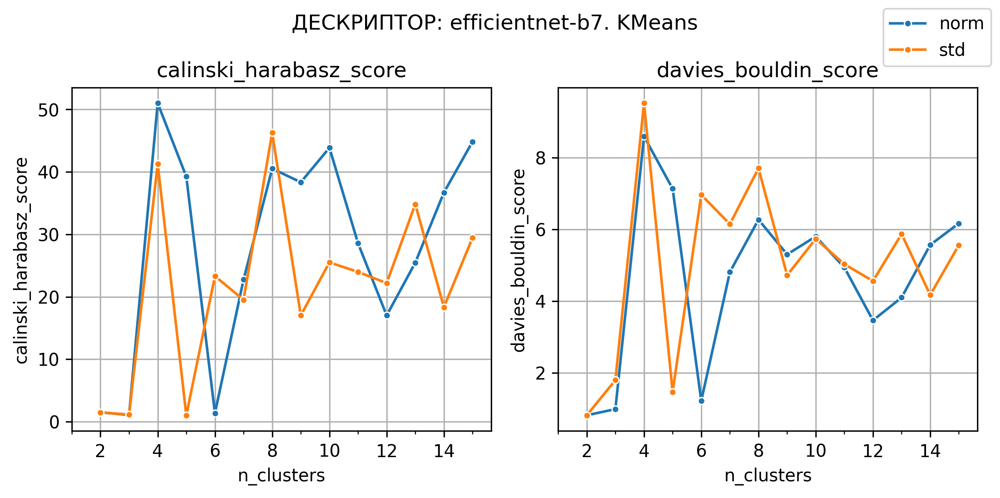

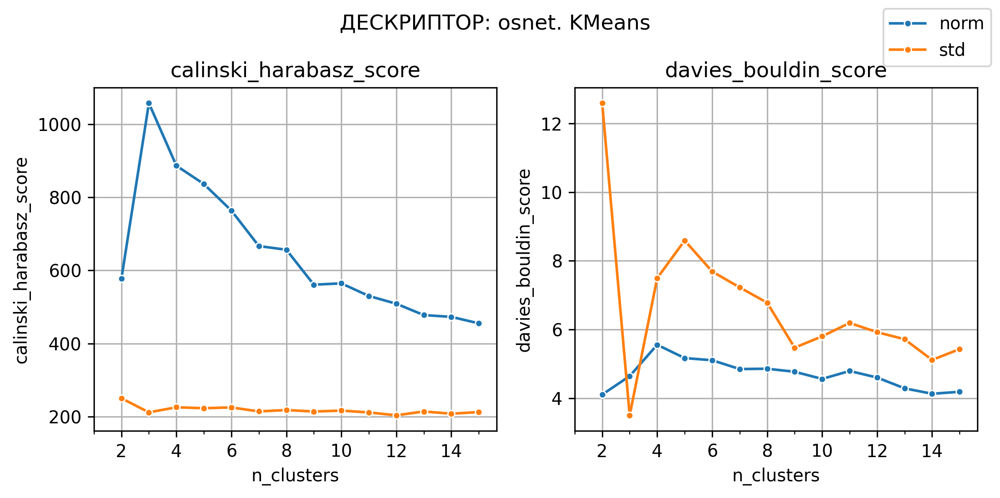

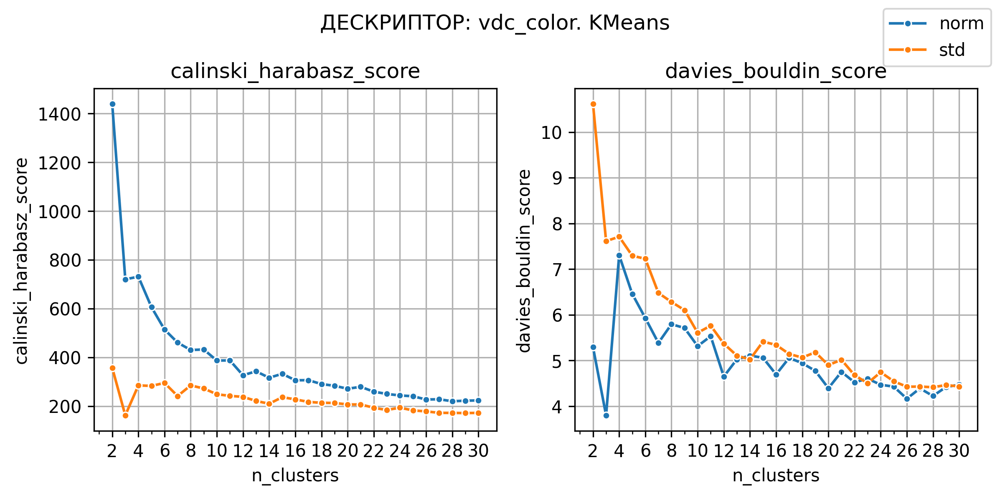

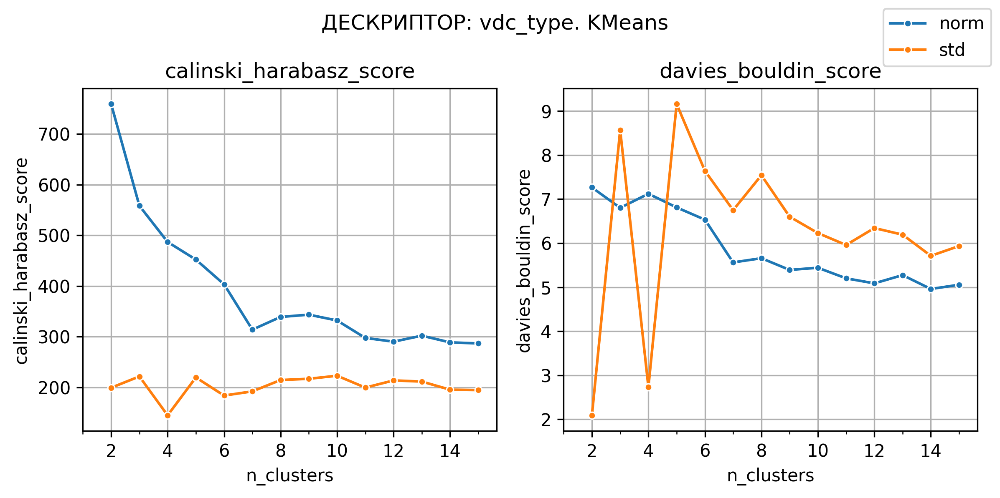

In [6]:
kmeans_df = cluster_results_df[cluster_results_df['cluster_class'] == 'KMeans']

for descriptor in kmeans_df['descriptor'].unique():
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    for i, cluster_class in enumerate(
        kmeans_df['cluster_class'].unique()
    ): 
        # Select data for current descriptor and considered class
        data = kmeans_df[
            (kmeans_df['descriptor'] == descriptor) &
                (kmeans_df['cluster_class'] == cluster_class)
        ]
        
        for j, score in enumerate([
            'calinski_harabasz_score', 'davies_bouldin_score'
        ]):
            sns.lineplot(
                data, 
                x='n_clusters', 
                y=score, 
                hue='scaler',
                marker='o',
                markersize=4,
                ax=axes[j],
            )
            axes[j].set_title(f'{score}')
        
    # Setup all axes
    for ax in axes.flat:
        ax.set_xticks(np.arange(2, data['n_clusters'].max()+1, 2))
        ax.set_xticks(np.arange(1, data['n_clusters'].max()+1), minor=True)
        ax.grid()
        ax.get_legend().remove()
    
    lines_labels = axes[1].get_legend_handles_labels()
    lines, labels = lines_labels
    fig.legend(lines, labels)
    
    fig.suptitle(f'ДЕСКРИПТОР: {descriptor}'+'. KMeans')
    plt.tight_layout()

**KMEANS**

**ДЕСКРИПТОР efficientnet-b7**:
- наилучшее масштабирование: "norm"?
- наилучшее число кластеров по метрике Калински — Харабаса: 4
- наилучшее число кластеров по метрике Дэвиса — Болдина: 6
- ПРОВЕРИТЬ: 4, 5, 6, 7, 8, 9, 10

**ДЕСКРИПТОР osnet**:
- наилучшее масштабирование: "norm"
- наилучшее число кластеров по метрике Калински — Харабаса: 3
- наилучшее число кластеров по метрике Дэвиса — Болдина: 2, 14
- ПРОВЕРИТЬ: 2, 3, 5, 7, 10, 14

**ДЕСКРИПТОР vdc_color**:
- наилучшее масштабирование: "norm"
- наилучшее число кластеров по метрике Калински — Харабаса: 2
- наилучшее число кластеров по метрике Дэвиса — Болдина: 3, 26
- ПРОВЕРИТЬ: 2, 3, 5, 7, 10, 12, 16, 20, 26

**ДЕСКРИПТОР vdc_type**:
- наилучшее масштабирование: "norm"
- наилучшее число кластеров по метрике Калински — Харабаса: 2
- наилучшее число кластеров по метрике Дэвиса — Болдина: 14
- ПРОВЕРИТЬ: 2, 3, 5, 7, 9, 14

##### Перейдём теперь к анализу DBSCAN и HDBSCAN

Рассмотрим параметры, при которых обнаруживается 2 и более кластеров (вместе с выбросами):

In [7]:
dbscan_df_rare = cluster_results_df[
    cluster_results_df['cluster_class'].isin(['DBSCAN', 'HDBSCAN'])
]

mask = dbscan_df_rare['n_clusters']>=2

dbscan_df = dbscan_df_rare[mask]

params = pd.DataFrame(
    list(
        dbscan_df['cluster_class_params'].values
    )
)
display(params.describe().T)

val = dbscan_df.shape[0] / dbscan_df_rare.shape[0] * 100
print(
    f'Только {val:.2f}% имеют 2 и более кластеров'
)

,count,mean,std,min,25%,50%,75%,max
eps,96.0,8.802083,9.060754,1.0,2.0,2.0,16.0,32.0
min_samples,96.0,133.750000,164.471018,8.0,16.0,64.0,256.0,512.0
min_cluster_size,17.0,21.647059,15.169629,8.0,8.0,16.0,32.0,64.0


Только 15.52% имеют 2 и более кластеров


Сравним между собой методы масштабирования:

In [9]:
print('calinski_harabasz_score')
display(
    dbscan_df.groupby('scaler')['calinski_harabasz_score'].agg(
        ['median', 'max']
    )
)
print('davies_bouldin_score')
display(
    dbscan_df.groupby('scaler')['davies_bouldin_score'].agg(['min', 'median'])
)

calinski_harabasz_score


,median,max
scaler,,
norm,70.485664,551.038708
std,62.399098,187.154412


davies_bouldin_score


,min,median
scaler,,
norm,0.419597,5.700566
std,1.137403,6.224487


Видим, что по обоим метрикам лучше 'norm'-метод масштабирования ('MinMaxScaler')

Отсортируем модели в рамках дескрипторов по метрикам и отберём параметры для более точного анализа:

In [12]:
dbscan_df_norm = dbscan_df[dbscan_df['scaler'] == 'norm']
display_models(dbscan_df_norm)

ДЕСКРИПТОР: efficientnet-b7


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
31,DBSCAN,"{'eps': 2.0, 'min_samples': 8.0}",2,74.645792,20.025297
91,DBSCAN,"{'eps': 2.0, 'min_samples': 256.0}",2,74.643309,20.045097
67,DBSCAN,"{'eps': 2.0, 'min_samples': 64.0}",2,74.632674,20.034368
43,DBSCAN,"{'eps': 2.0, 'min_samples': 16.0}",2,74.630429,20.028929
103,DBSCAN,"{'eps': 2.0, 'min_samples': 512.0}",2,74.630070,20.060416
79,DBSCAN,"{'eps': 2.0, 'min_samples': 128.0}",2,74.626737,20.038402
55,DBSCAN,"{'eps': 2.0, 'min_samples': 32.0}",2,74.617738,20.032258


ДЕСКРИПТОР: osnet


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
409,HDBSCAN,{'min_cluster_size': 64},3,270.586262,7.274930
408,HDBSCAN,{'min_cluster_size': 32},21,100.451778,3.012364
407,HDBSCAN,{'min_cluster_size': 16},10,90.426950,3.065218
406,HDBSCAN,{'min_cluster_size': 8},18,66.353590,2.474021
312,DBSCAN,"{'eps': 1.0, 'min_samples': 512.0}",2,551.038708,7.305536
300,DBSCAN,"{'eps': 1.0, 'min_samples': 256.0}",2,530.202636,8.269678
288,DBSCAN,"{'eps': 1.0, 'min_samples': 128.0}",3,283.963413,6.802102
276,DBSCAN,"{'eps': 1.0, 'min_samples': 64.0}",5,182.593805,5.069501
264,DBSCAN,"{'eps': 1.0, 'min_samples': 32.0}",6,128.885175,4.865930
252,DBSCAN,"{'eps': 1.0, 'min_samples': 16.0}",14,74.966108,3.139562


ДЕСКРИПТОР: vdc_color


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
648,HDBSCAN,{'min_cluster_size': 32},3,88.844325,9.717435
646,HDBSCAN,{'min_cluster_size': 8},3,63.902857,7.969127
552,DBSCAN,"{'eps': 1.0, 'min_samples': 512.0}",2,187.506982,14.634818
540,DBSCAN,"{'eps': 1.0, 'min_samples': 256.0}",2,185.960690,14.563257
528,DBSCAN,"{'eps': 1.0, 'min_samples': 128.0}",2,182.619923,14.551272
516,DBSCAN,"{'eps': 1.0, 'min_samples': 64.0}",2,179.982592,14.513650
504,DBSCAN,"{'eps': 1.0, 'min_samples': 32.0}",2,176.504317,14.494997
492,DBSCAN,"{'eps': 1.0, 'min_samples': 16.0}",2,172.789296,14.467744
480,DBSCAN,"{'eps': 1.0, 'min_samples': 8.0}",3,86.197955,10.374620
481,DBSCAN,"{'eps': 2.0, 'min_samples': 8.0}",2,5.513926,0.419597


ДЕСКРИПТОР: vdc_type


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
858,HDBSCAN,{'min_cluster_size': 32},5,57.190837,8.486809
856,HDBSCAN,{'min_cluster_size': 8},6,44.341713,6.331630
857,HDBSCAN,{'min_cluster_size': 16},4,40.215543,7.689987
750,DBSCAN,"{'eps': 1.0, 'min_samples': 256.0}",2,182.631696,14.678003
738,DBSCAN,"{'eps': 1.0, 'min_samples': 128.0}",2,181.415734,14.963861
726,DBSCAN,"{'eps': 1.0, 'min_samples': 64.0}",2,178.883398,15.078952
762,DBSCAN,"{'eps': 1.0, 'min_samples': 512.0}",2,171.461884,14.580522
714,DBSCAN,"{'eps': 1.0, 'min_samples': 32.0}",3,99.195071,10.746867
739,DBSCAN,"{'eps': 2.0, 'min_samples': 128.0}",2,57.241166,1.975067
751,DBSCAN,"{'eps': 2.0, 'min_samples': 256.0}",2,56.619278,2.084929


Таким образом, на данной итерации уточнены параметры кластеризации для последующего анализа, а также выбран MinMax-(norm-)метод масштабирования.

#### Кластеризация. Итерация 2. Уточнение сетки и анализ половины данных

Уточним сетку и проведём более качественный анализ (c бОльшим количеством данных)

In [13]:
selected_params = {
    'efficientnet-b7': {
        DBSCAN: {
            'eps': [2.],
            'min_samples': [64, 256],    
        },
        KMeans: {'n_clusters': [3, 4, 5, 6, 7, 8, 9, 10]},
    },
    
    'osnet': {
        DBSCAN: {
            'eps': [1.],
            'min_samples': 4**np.arange(2, 7),    
        },
        HDBSCAN: {
            'min_cluster_size': [16, 24, 32, 48, 64, 96],
        },
        KMeans: {'n_clusters': [2, 3, 5, 7, 10, 14]},
    },
    
    'vdc_color': {
        DBSCAN: {
            'eps': [1.],
            'min_samples': 4**np.arange(2, 7),    
        },
        HDBSCAN: {
            'min_cluster_size': [8, 24, 32, 48],
        },
        KMeans: {'n_clusters': [2, 3, 5, 7, 10, 12, 16, 20, 26]},
    },
    
    'vdc_type':{
        DBSCAN: {
            'eps': [1.],
            'min_samples': 2**np.arange(5, 12),    
        },
        HDBSCAN: {
            'min_cluster_size': [8, 12, 16, 24, 32, 48],
        },
        KMeans: {'n_clusters': [2, 3, 5, 7, 9, 14]},
    },
}

cluster_results = conduct_grid_search(
    selected_params,
    data_fraction=0.5,
    scaler=['norm'],
    delay=2., # Extra time to free GPU-memory
)

cluster_results_df = pd.DataFrame(cluster_results)
cluster_results_df.to_csv('results/refined_scores.csv', index=False)
cluster_results_df.head()

ДЕСКРИПТОР efficientnet-b7
Модель кластеризации: DBSCAN
Метод масштабирования: norm
{'eps': 2.0, 'min_samples': 64.0} ...	DONE!
{'eps': 2.0, 'min_samples': 256.0} ...	DONE!

Модель кластеризации: KMeans
Метод масштабирования: norm
{'n_clusters': 3} ...	DONE!
{'n_clusters': 4} ...	DONE!
{'n_clusters': 5} ...	DONE!
{'n_clusters': 6} ...	DONE!
{'n_clusters': 7} ...	DONE!
{'n_clusters': 8} ...	DONE!
{'n_clusters': 9} ...	DONE!
{'n_clusters': 10} ...	DONE!


ДЕСКРИПТОР osnet
Модель кластеризации: DBSCAN
Метод масштабирования: norm
{'eps': 1.0, 'min_samples': 16.0} ...	DONE!
{'eps': 1.0, 'min_samples': 64.0} ...	DONE!
{'eps': 1.0, 'min_samples': 256.0} ...	DONE!
{'eps': 1.0, 'min_samples': 1024.0} ...	DONE!
{'eps': 1.0, 'min_samples': 4096.0} ...	DONE!

Модель кластеризации: HDBSCAN
Метод масштабирования: norm
{'min_cluster_size': 16} ...	DONE!
{'min_cluster_size': 24} ...	DONE!
{'min_cluster_size': 32} ...	DONE!
{'min_cluster_size': 48} ...	DONE!
{'min_cluster_size': 64} ...	DONE!
{'min_clu

,descriptor,scaler,cluster_class,cluster_class_params,labels,n_clusters,calinski_harabasz_score,davies_bouldin_score
0,efficientnet-b7,norm,DBSCAN,"{'eps': 2.0, 'min_samples': 64.0}","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",2,188.191154,13.902225
1,efficientnet-b7,norm,DBSCAN,"{'eps': 2.0, 'min_samples': 256.0}","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",2,188.242287,13.903033
2,efficientnet-b7,norm,KMeans,{'n_clusters': 3},"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",3,1.607793,0.798016
3,efficientnet-b7,norm,KMeans,{'n_clusters': 4},"[1, 1, 1, 2, 2, 2, 1, 2, 1, 2, 2, 1, 1, 2, 2, ...",4,316.744556,7.763126
4,efficientnet-b7,norm,KMeans,{'n_clusters': 5},"[1, 1, 1, 4, 4, 4, 4, 4, 1, 4, 4, 1, 1, 4, 4, ...",5,235.345679,6.611314


По метрикам виден большой разброс от единиц до нескольких тысяч (для Индекса Калински-Харабаса) [см. полную версию ноутбука - ссылка в README.md или файл "results/refined_scores.csv"]: наилучшие значения далее отобраны для полноценного анализа.
По столбчатым диаграммам: ряд моделей возвращает малоразмерные кластеры - кандидаты на отброс.

#### Кластеризация. Итерация 3. Отбор нескольких наилучших параметров для каждого дескриптора и моделирование на полном наборе данных

**Отберём наилучшие модели для каждого дескриптора по метрикам и столбчатым диаграммам**

Ниже приведён словарь параметров, отобранных для каждого дескриптора как по метрикам, так и по столбчатым диаграммам.

In [3]:
best_scaler = 'norm'

selected_params = {
    'efficientnet-b7': {
        KMeans: {'n_clusters': [6, 4, 8]},
        DBSCAN: {
            'eps': [2],
            'min_samples': [256],    
        },
    },
    
    'osnet': {
        KMeans: {'n_clusters': [2, 3, 5]},
        DBSCAN: {
            'eps': [1, 1],
            'min_samples': [4096, 1024],    
        },
        HDBSCAN: {
            'min_cluster_size': [96, 64, 24]
        }
    },
    
    'vdc_color': {
        KMeans: {'n_clusters': [2, 3, 5, 7, 16]},
        DBSCAN: {
            'eps': [1, 1, 1],
            'min_samples': [4096, 1024, 256],     
        },
        HDBSCAN: {
            'min_cluster_size': [48, 32, 8]
        }
    },
    
    'vdc_type':{
        KMeans: {'n_clusters': [2, 3, 5, 7, 9]},
        DBSCAN: {
            'eps': [1, 1, 1],
            'min_samples': [2048, 1024, 512],    
        },
        HDBSCAN: {
            'min_cluster_size': [12, 16, 24]
        }
    },
}

cluster_results = conduct_grid_search(
    selected_params,
    get_mesh=False,
    data_fraction=1.0,
    scaler=['norm'],
    delay=2., # Extra time to free GPU-memory
)

ДЕСКРИПТОР efficientnet-b7
Модель кластеризации: KMeans
Метод масштабирования: norm
{'n_clusters': 6} ...	DONE!
{'n_clusters': 4} ...	DONE!
{'n_clusters': 8} ...	DONE!

Модель кластеризации: DBSCAN
Метод масштабирования: norm
{'eps': 2, 'min_samples': 256} ...	DONE!


ДЕСКРИПТОР osnet
Модель кластеризации: KMeans
Метод масштабирования: norm
{'n_clusters': 2} ...	DONE!
{'n_clusters': 3} ...	DONE!
{'n_clusters': 5} ...	DONE!

Модель кластеризации: DBSCAN
Метод масштабирования: norm
{'eps': 1, 'min_samples': 4096} ...	DONE!
{'eps': 1, 'min_samples': 1024} ...	DONE!

Модель кластеризации: HDBSCAN
Метод масштабирования: norm
{'min_cluster_size': 96} ...	DONE!
{'min_cluster_size': 64} ...	DONE!
{'min_cluster_size': 24} ...	DONE!


ДЕСКРИПТОР vdc_color
Модель кластеризации: KMeans
Метод масштабирования: norm
{'n_clusters': 2} ...	DONE!
{'n_clusters': 3} ...	DONE!
{'n_clusters': 5} ...	DONE!
{'n_clusters': 7} ...	DONE!
{'n_clusters': 16} ...	DONE!

Модель кластеризации: DBSCAN
Метод масштабиро

Сохраним и выведем полученные модели:

ДЕСКРИПТОР: efficientnet-b7


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
2,KMeans,{'n_clusters': 8},8,870.833571,8.571731
0,KMeans,{'n_clusters': 6},6,786.373095,9.153244
1,KMeans,{'n_clusters': 4},4,657.248199,7.653182
3,DBSCAN,"{'eps': 2, 'min_samples': 256}",2,251.980365,10.569928


ДЕСКРИПТОР: osnet


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
4,KMeans,{'n_clusters': 2},2,18166.924809,4.636691
5,KMeans,{'n_clusters': 3},3,12546.592945,4.261826
6,KMeans,{'n_clusters': 5},5,9758.290900,4.866749
9,HDBSCAN,{'min_cluster_size': 96},9,1106.080032,3.436839
10,HDBSCAN,{'min_cluster_size': 64},16,864.263185,2.689393
11,HDBSCAN,{'min_cluster_size': 24},5,491.449272,3.831111
7,DBSCAN,"{'eps': 1, 'min_samples': 4096}",2,6487.073754,7.100532
8,DBSCAN,"{'eps': 1, 'min_samples': 1024}",2,4636.493398,7.354948


ДЕСКРИПТОР: vdc_color


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
12,KMeans,{'n_clusters': 2},2,18384.385466,4.684857
13,KMeans,{'n_clusters': 3},3,11343.446239,6.155285
14,KMeans,{'n_clusters': 5},5,7572.692050,6.194432
15,KMeans,{'n_clusters': 7},7,5941.530171,5.557471
16,KMeans,{'n_clusters': 16},16,3692.900222,5.010871
20,HDBSCAN,{'min_cluster_size': 48},3,340.574372,5.012088
21,HDBSCAN,{'min_cluster_size': 32},3,340.574372,5.012088
22,HDBSCAN,{'min_cluster_size': 8},4,323.044286,4.111421
17,DBSCAN,"{'eps': 1, 'min_samples': 4096}",2,1604.884073,7.600295
18,DBSCAN,"{'eps': 1, 'min_samples': 1024}",2,1518.459370,7.466180


ДЕСКРИПТОР: vdc_type


,cluster_class,cluster_class_params,n_clusters,calinski_harabasz_score,davies_bouldin_score
23,KMeans,{'n_clusters': 2},2,9598.496067,6.437790
24,KMeans,{'n_clusters': 3},3,6377.624753,6.833161
25,KMeans,{'n_clusters': 5},5,4358.761612,6.555906
26,KMeans,{'n_clusters': 7},7,3857.951288,5.914477
27,KMeans,{'n_clusters': 9},9,3423.736996,5.438497
33,HDBSCAN,{'min_cluster_size': 24},3,580.334692,6.611426
31,HDBSCAN,{'min_cluster_size': 12},5,362.364601,5.636249
32,HDBSCAN,{'min_cluster_size': 16},5,361.092797,5.555438
28,DBSCAN,"{'eps': 1, 'min_samples': 2048}",2,1344.643930,9.455507
29,DBSCAN,"{'eps': 1, 'min_samples': 1024}",2,1305.850813,9.170703


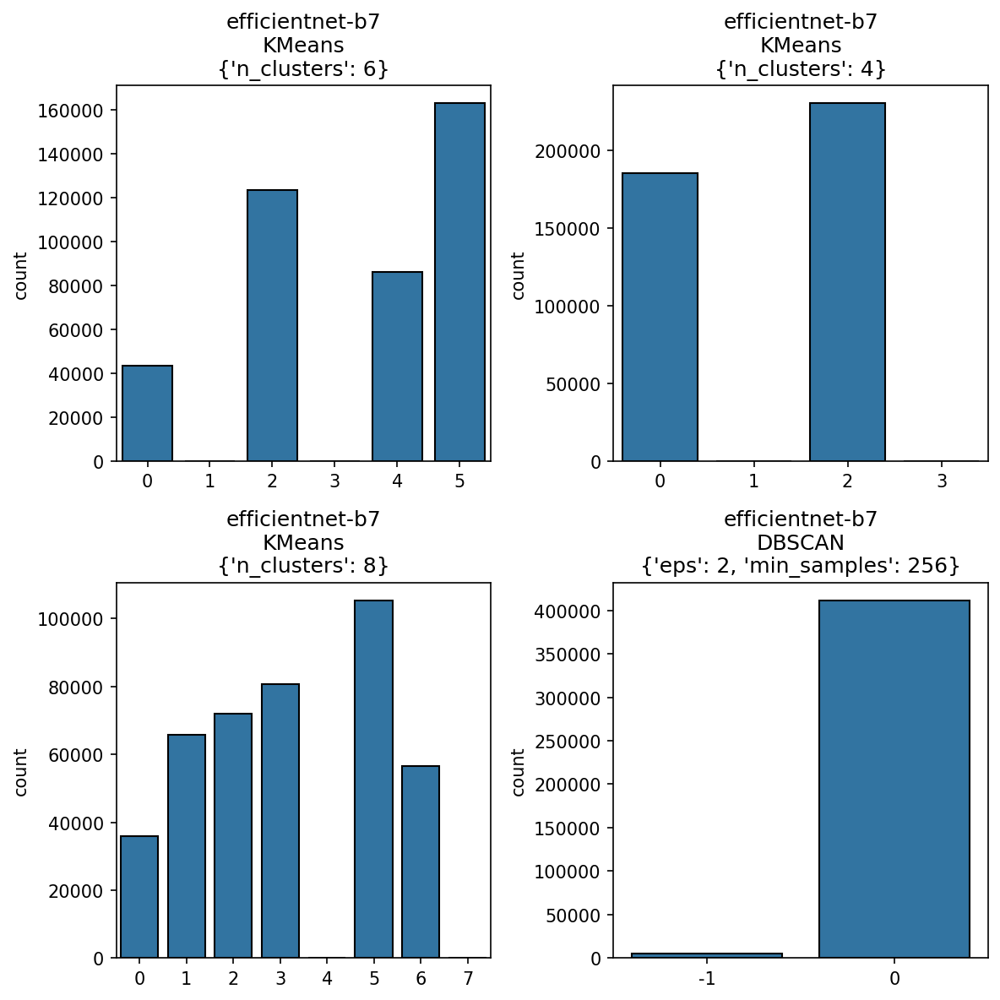

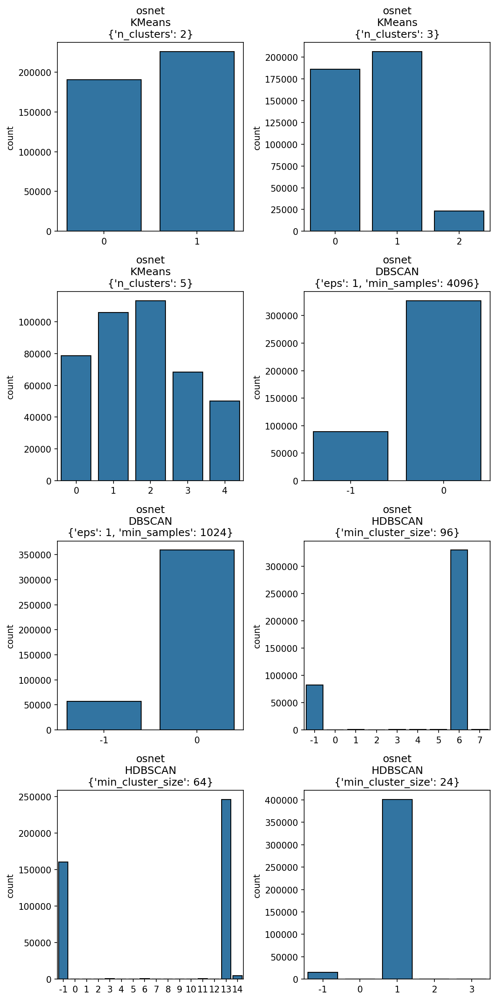

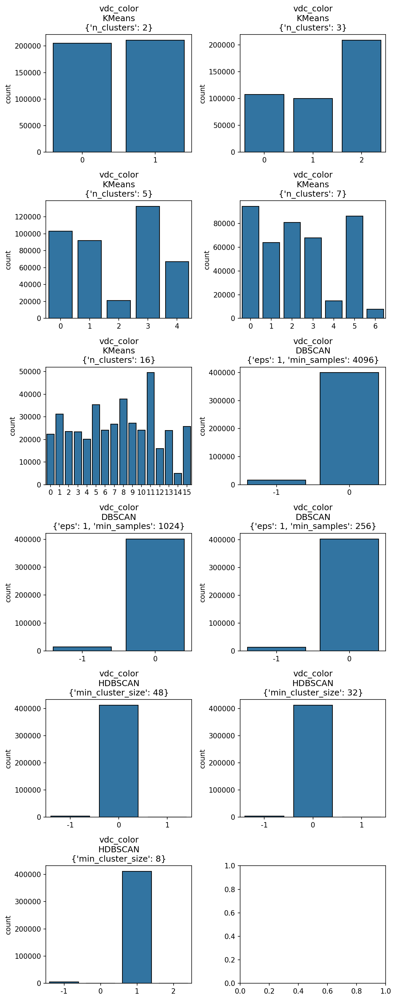

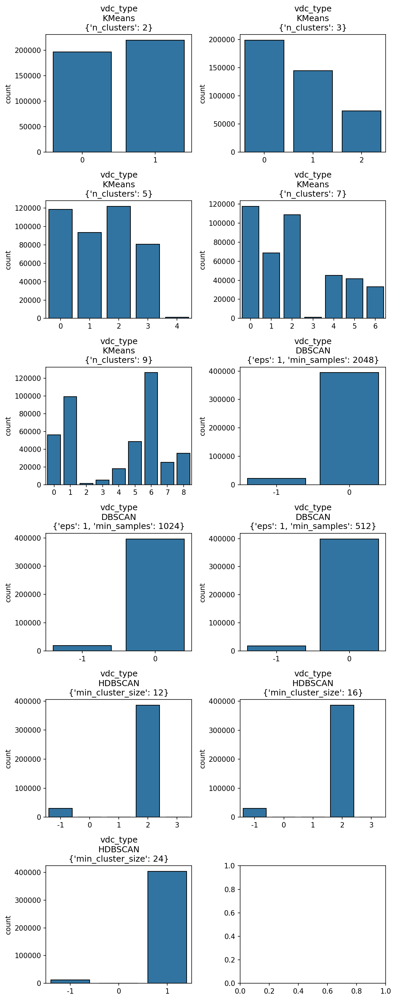

In [6]:
cluster_results_df = pd.DataFrame(cluster_results)
cluster_results_df.to_csv('results/prefinal_scores.csv', index=False)

display_models(cluster_results_df)
countplot_clusters(cluster_results_df)

#### ВЫВОДЫ по моделям кластеризации на основе метрик и столбчатых диаграмм:

В ряде случаев, полученные кластеры имеют малое количество объектов, принадлежащих кластеру. Это кандидаты на убывание из списка.

- Наилучшие показатели по метрикам демонстрируют дескрипторы **osnet**, **vdc_color**.

- Дескриптор **efficient-b7**: лучше всего себя проявил алгоритм KMeans с числом кластеров **8**. Эта модель демонстрирует и удовлетворительные результаты по разбиению на кластеры.

- Дескриптор **osnet**: наилучшие показатели достигнуты алгоритмом KMeans при числе кластеров **2**. Также можно оценить изображения, попавшие в кластеры моделей с числом кластеров **3 и 5**.

- Дескриптор **vdc_color**: наилучшие показатели достигнуты алгоритмом KMeans при числе кластеров **2**. Однако, так как данный дескриптор отвечает за цвета, имеет смысл проверить полученные изображения и с бОльшим числом кластеров: **7 и 16**

- Дескриптор **vdc_type**: наилучшие показатели достигнуты алгоритмом KMeans при числе кластеров **2**. Также имеет смысл оценить изображения, попавшие в кластеры моделей с числом кластеров **5 и 9**.

Проинтерпретируем полученные кластеры ещё и визуально и отберём лучшие модели.

### 3.2. Интерпретация кластеров

#### 3.2.1 Визуализация кластеров

Визуализируйте результаты кластеризации в двух- или трёхмерном пространстве, предварительно понизив размерность дескрипторов изображений до соответствующих размерностей с помощью метода t-SNE (решено использовать UMAP). 

По результатам визуализации кластеров сделайте предположение о качестве полученной кластеризации.

Рассмотрим кластеризацию без фильтрации по признакам [См. в полной версии ноутбука - ссылка в README.md]

В ряде дескрипторов наблюдаются значительные выбросы. Введём пороговую фильтрацию, чтобы рассмотреть кластеры детальнее

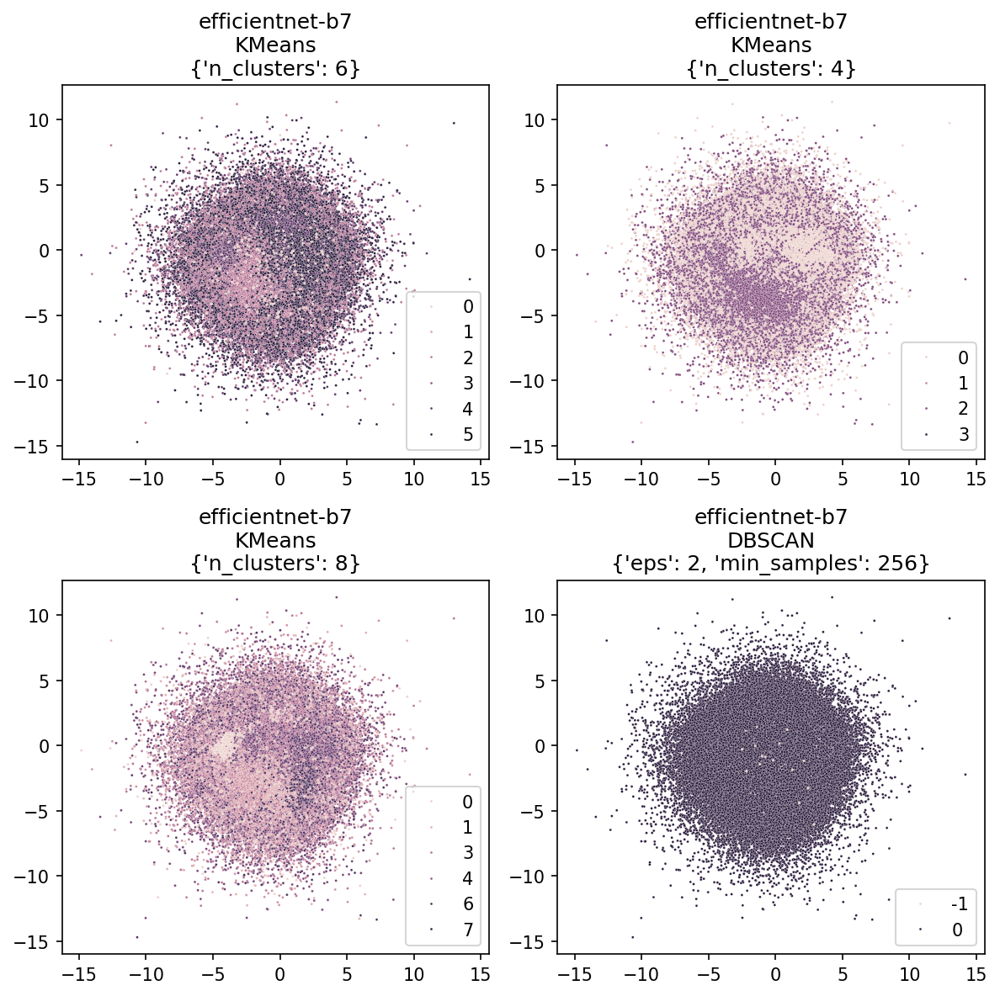

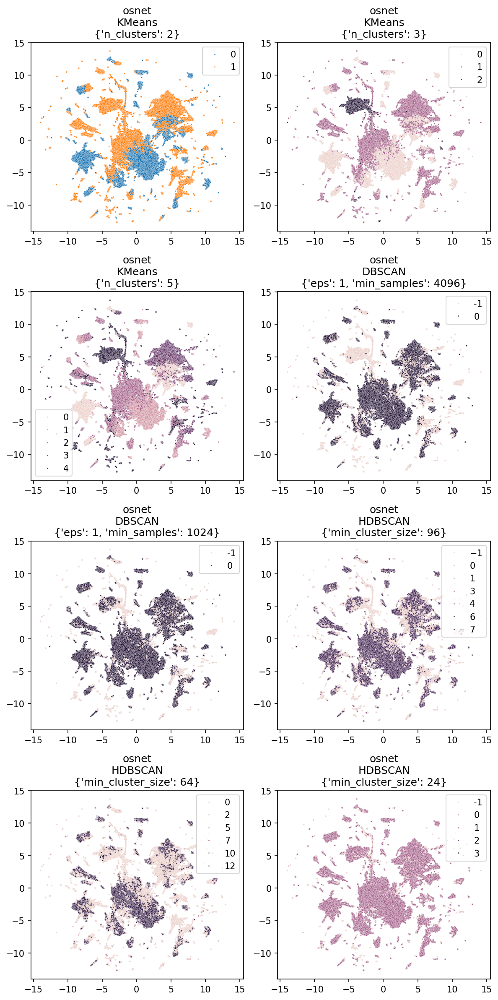

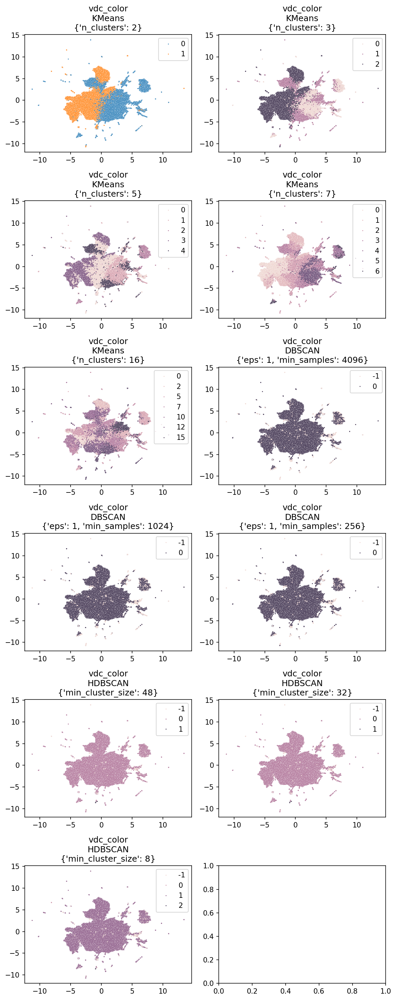

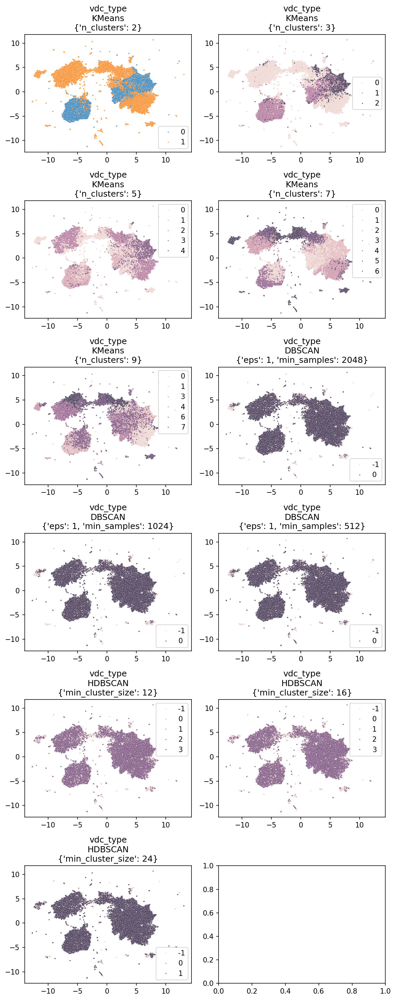

In [7]:
get_cluster_visualization(cluster_results_df, thresh=(-15, 15))

Рассмотрим также и трёхмерные проекции

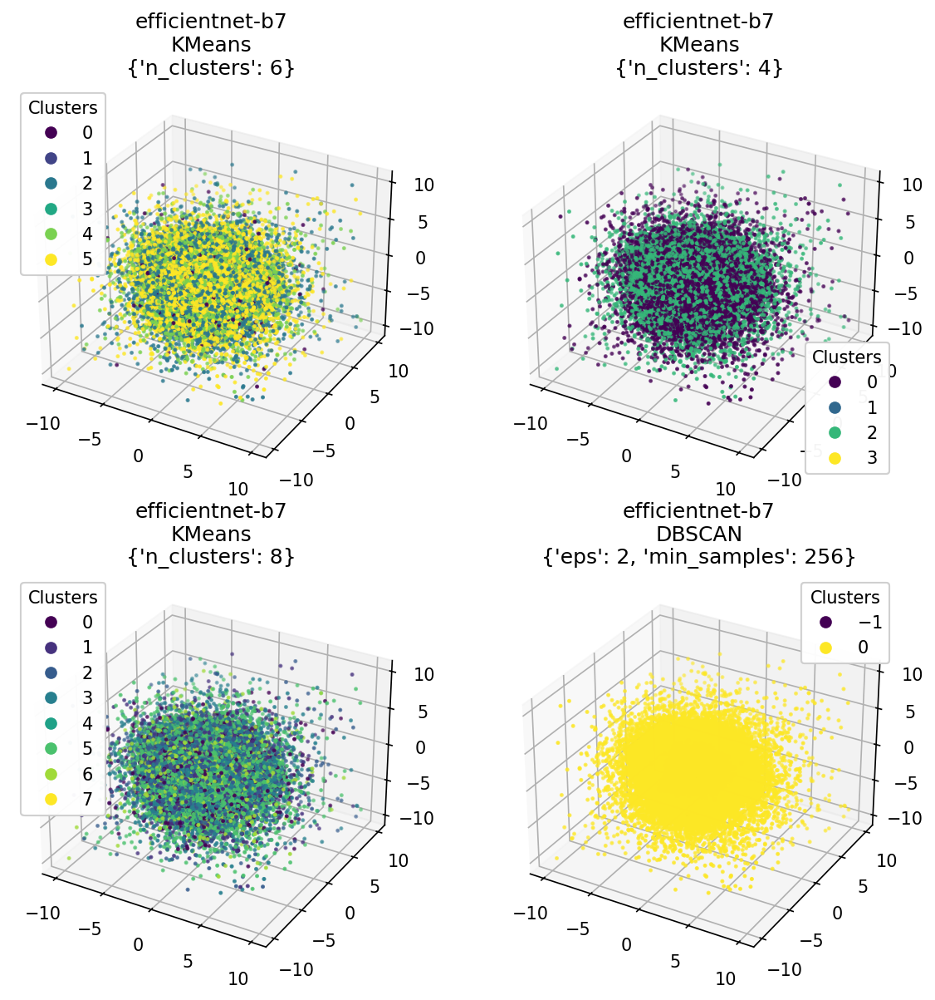

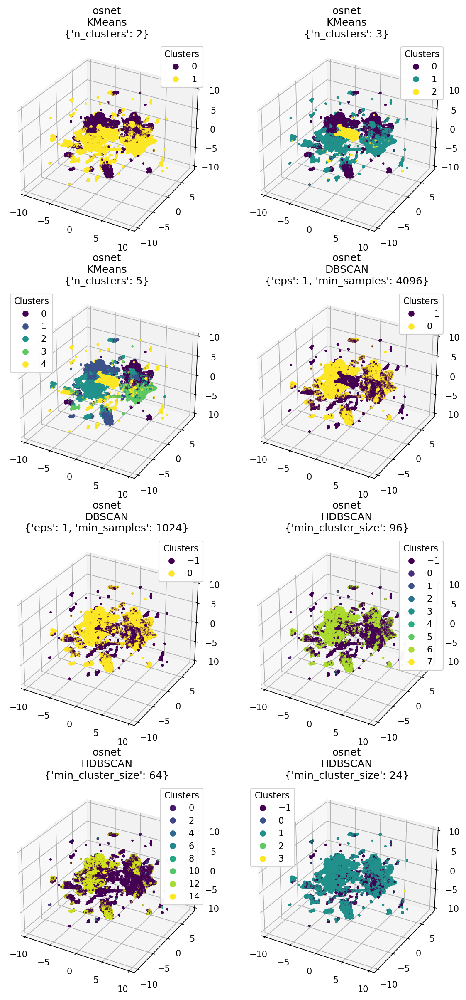

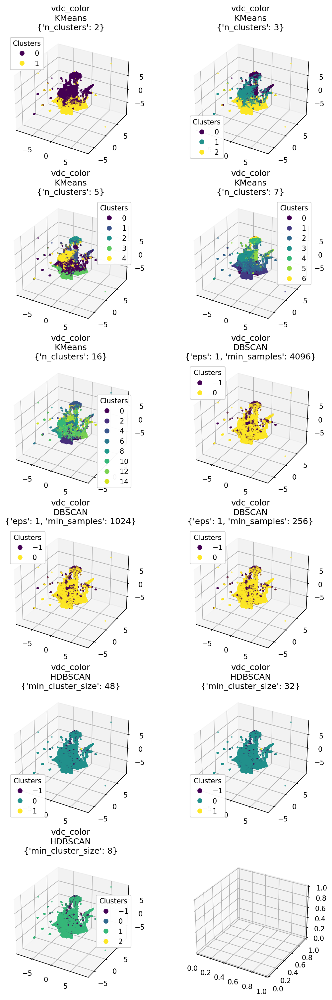

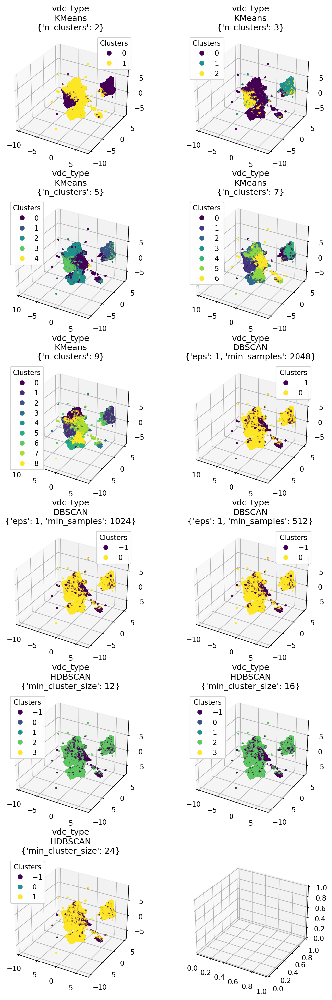

In [8]:
get_cluster_visualization( 
    cluster_results_df,
    n_components=3,
    thresh=(-10,10)
)

#### Выводы по визуализации кластеров:

По результатам визуализации сделаем предположение о качестве полученной кластеризации.

- Дескриптор **efficient-b7**: Визуализация в 2D и 3D представляет собой один плотный "сгусток". Выделение кластеров визуально не может быть объяснено. Требуется проверка изображений, попавших в кластеры.

- Дескриптор **osnet**: Наиболее "качественной" кажется картина кластеризации, полученная KMeans c числом кластеров **5** в 2D и **2 и 3** в 3D. Однако при таком уменьшении числа признаком сложно визуально объяснить такую кластеризацию.

- Дескриптор **vdc_color**: Здесь также преуспевает KMeans. В 2D с числом кластеров **7** в 3D: **2**, и **5**.

- Дескриптор **vdc_type**: хотелось бы отметить KMeans с числом кластеров **2** и **7** в 2D, а также число кластеров **5** в 3D.

Продолжение работы смотрите в части 2.